#### Step 1: Import libraries

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import glob
import warnings

from tqdm.notebook import tqdm
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from google.colab import files

warnings.filterwarnings('ignore')

In [ ]:
# Install Kaggle API
!pip install -q kaggle
!pip install -q kaggle-cli    

In [3]:
os.environ['KAGGLE_USERNAME'] = "YOUR_KAGGLE_USERNAME" 
os.environ['KAGGLE_KEY'] = "YOUR_KAGGLE_KEY"

#### Step 2: Download the CelebA dataset from Kaggle.
**About CelebA:** CelebFaces Attributes Dataset (CelebA) is a large-scale face attributes dataset with more than 200K celebrity images.

In [4]:
!kaggle datasets download -d jessicali9530/celeba-dataset --unzip

100% 1.33G/1.33G [00:59<00:00, 24.3MB/s]
100% 1.33G/1.33G [00:59<00:00, 24.1MB/s]


#### Step 3: Inspecting/modify the dataset

In [5]:
BASE_DIR = '/content/img_align_celeba/img_align_celeba'

# Get path for all the images.
image_paths = []
for img_name in os.listdir(BASE_DIR):
  image_path = os.path.join(BASE_DIR, img_name)
  image_paths.append(image_path)

In [6]:
# Check total no. of images.
len(image_paths)

202599

##### The CelebA dataset has approximately 202.6K images. We will train the model on a smaller subset of the original dataset.

In [7]:
# Delete the last 1,80,000 images as we don't need so many images.
imgs_delete=os.listdir('/content/img_align_celeba/img_align_celeba')[:180000]

for file_ in imgs_delete:
    os.remove(os.path.join('/content/img_align_celeba/img_align_celeba', file_))

# Get path for the remaining images.
image_paths = []
for img_name in os.listdir(BASE_DIR):
  image_path = os.path.join(BASE_DIR, img_name)
  image_paths.append(image_path)

In [8]:
# Check no. of images left.
len(image_paths)

22599

In [9]:
# Create a new directory of the resized images.
%mkdir /content/resized

In [ ]:
# Resize the images to 64 x 64 pixels.
image_list = []
resized_images = []

for filename in glob.glob('/content/img_align_celeba/img_align_celeba/*.jpg'):
    img = Image.open(filename)
    image_list.append(img)

for image in image_list:
    image = image.resize((64, 64))
    resized_images.append(image)

# Save the resized images into the new "resized" folder.
for (i, new) in enumerate(resized_images):
    new.save('{}{}{}'.format('/content/resized/', i+1, '.jpg'))

In [11]:
BASE_DIR = '/content/resized'

# Get path of the new resized images.
image_paths = []
for img_name in os.listdir(BASE_DIR):
  image_path = os.path.join(BASE_DIR, img_name)
  image_paths.append(image_path)

In [12]:
# Check no. of images.
len(image_paths)

22599

In [13]:
# Print the path of some images.
image_paths[:5]

['/content/resized/6586.jpg',
 '/content/resized/9861.jpg',
 '/content/resized/12156.jpg',
 '/content/resized/17309.jpg',
 '/content/resized/6422.jpg']

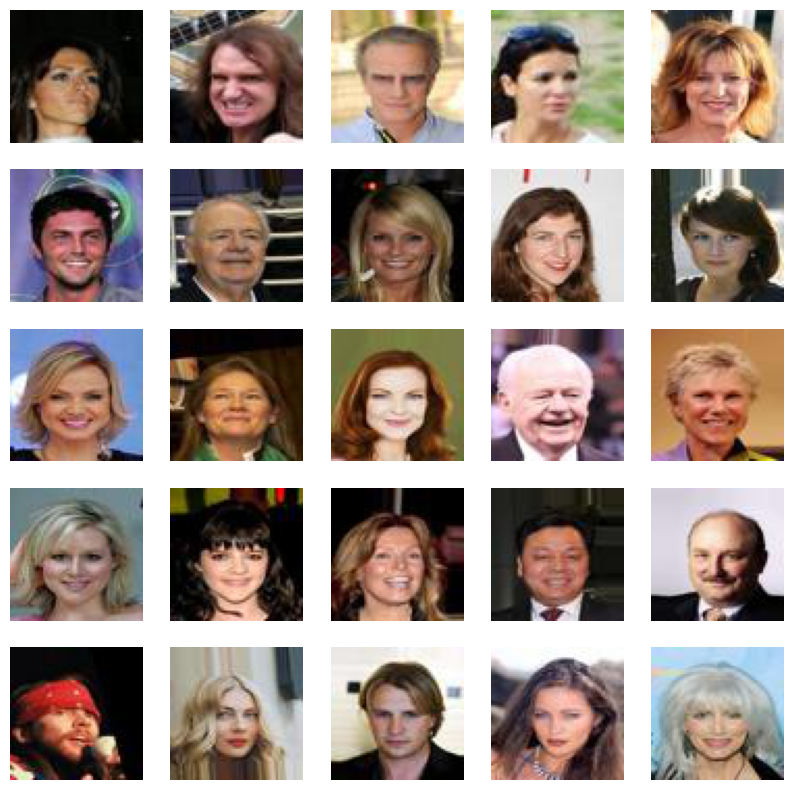

In [19]:
# Plot some images.
plt.figure(figsize=(10, 10))
temp_images = image_paths[:25]
index = 1

for image_path in temp_images:
  plt.subplot(5, 5, index)
  img = load_img(image_path)
  img = np.array(img)
  plt.imshow(img)
  plt.axis('off')
  index += 1

#### Step 4: Preprocess Images

In [20]:
# Load the images into a NumPy array.
train_images = [np.array(load_img(path)) for path in tqdm(image_paths)]
train_images = np.array(train_images)

  0%|          | 0/22599 [00:00<?, ?it/s]

In [21]:
# Print the shape of the train_images NumPy array.
train_images.shape

(22599, 64, 64, 3)

In [22]:
train_images = train_images.reshape(train_images.shape[0], 64, 64, 3).astype('float32')

In [23]:
# Normalize the images.
# Generator model has the activation layer (tanh) in the range [-1, 1]. Hence, we subtract 127.5 and divide the result with 127.5.
train_images = (train_images - 127.5)/127.5

In [ ]:
# Print the NumPy array.
train_images[0]

#### Step 5: Create the Generator and Discriminator models.

In [25]:
# Latent dimension for random noise.
LATENT_DIM = 100

# Initialize the weight.
WEIGHT_INIT = keras.initializers.RandomNormal(mean = 0.0, stddev = 0.02)

# No. of channels in the image.
CHANNELS = 3

##### Define the architecture for the Generator model.

In [26]:
model = Sequential(name = 'generator')

# 1D random noise.
model.add(layers.Dense(8 * 8 * 512, input_dim = LATENT_DIM))
model.add(layers.ReLU())

# Convert 1D to 3D.
model.add(layers.Reshape((8, 8, 512)))

# Upsample to 16x16.
model.add(layers.Conv2DTranspose(256, (4,4), strides = (2,2), padding = 'same', kernel_initializer = WEIGHT_INIT))
model.add(layers.ReLU())

model.add(layers.Conv2DTranspose(128, (4,4), strides = (2,2), padding = 'same', kernel_initializer = WEIGHT_INIT))
model.add(layers.ReLU())

model.add(layers.Conv2DTranspose(64, (4,4), strides = (2,2), padding = 'same', kernel_initializer = WEIGHT_INIT))
model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS, (4, 4), padding = 'same', activation = 'tanh'))

generator = model
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             3309568   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 256)      2097408   
 nspose)                                                         
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 32, 32, 128)      524416    
 ranspose)                                               

##### Define the architecture for the Discriminator model.

In [27]:
model = Sequential(name = 'discriminator')
input_shape = (64, 64, 3)
alpha = 0.2

# Create convolutional layers.
model.add(layers.Conv2D(64, (4, 4), strides = (2, 2), padding = 'same', input_shape = input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha = alpha))

model.add(layers.Conv2D(128, (4, 4), strides = (2, 2), padding = 'same', input_shape = input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha = alpha))

model.add(layers.Conv2D(64, (4, 4), strides = (2, 2), padding = 'same', input_shape = input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha = alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3)) # More strict the discriminator, difficult for the generator to produce new images.

# Output layer
model.add(layers.Dense(1, activation = 'sigmoid')) # Real or fake image.

discriminator = model
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 64)       256       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)     

#### Step 6: Create DCGAN: Combine the Generator and Discriminator models.

In [28]:
class DCGAN(keras.Model):
  def __init__(self, generator, discriminator, latent_dim):
    super().__init__()

    # Override the generator and discriminator models.
    self.generator = generator
    self.discriminator = discriminator
    self.latent_dim = LATENT_DIM
    self.g_loss_metric = keras.metrics.Mean(name = 'g_loss')
    self.d_loss_metric = keras.metrics.Mean(name = 'd_loss')

  @property
  def metrics(self):
    return [self.g_loss_metric, self.d_loss_metric]

  def compile(self, g_optimizer, d_optimizer, loss_fn):
    super(DCGAN, self).compile()
    self.g_optimizer = g_optimizer
    self.d_optimizer = d_optimizer
    self.loss_fn = loss_fn

  def train_step(self, real_images):
    # Get batch size from the input data.
    batch_size = tf.shape(real_images)[0]

    # Generate random noise.
    random_noise = tf.random.normal(shape = (batch_size, self.latent_dim))

    # Train the discriminator with real [1] and fake [0] images.
    with tf.GradientTape() as tape:
      # Compute loss on real images.
      pred_real = self.discriminator(real_images, training = True)

      # Generate real image labels.
      real_labels = tf.ones((batch_size, 1))
      real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
      d_loss_real = self.loss_fn(real_labels, pred_real)

      # Compute loss on fake images.
      fake_images = self.generator(random_noise)
      pred_fake = self.discriminator(fake_images, training=True)

      # Generate fake labels.
      fake_labels = tf.zeros((batch_size, 1))
      d_loss_fake = self.loss_fn(fake_labels, pred_fake)

      # Total discriminator loss.
      d_loss = (d_loss_real + d_loss_fake)/2

    # Compute discriminator gradients.
    gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)

    # Update the gradients.
    self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))

    # Train the generator model.
    labels = tf.ones((batch_size, 1))

    with tf.GradientTape() as tape:
      # Generate fake images from real images.
      fake_images = self.generator(random_noise, training=True)

      # Classify images as real or fake.
      pred_fake = self.discriminator(fake_images, training=True)

      # Compute loss.
      g_loss = self.loss_fn(labels, pred_fake)

    # Compute graidents.
    gradients = tape.gradient(g_loss, self.generator.trainable_variables)
      
    # Update the gradients.
    self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

    # Update states for both models.
    self.d_loss_metric.update_state(d_loss)
    self.g_loss_metric.update_state(g_loss)

    return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}
                                     

##### Monitor the training of the DCGAN model for each epoch.

In [29]:
class DCGANMonitor(keras.callbacks.Callback):
  def __init__(self, num_imgs = 25, latent_dim = 100):
    self.num_imgs = num_imgs
    self.latent_dim = latent_dim

    # Create random noise for generating images.
    self.noise = tf.random.normal([25, latent_dim])

  def on_epoch_end(self, epoch, logs=None):
    # Generate the image from noise.
    g_img = self.model.generator(self.noise)
      
    # Denormalize the image.
    g_img = (g_img * 127.5) + 127.5
    g_img.numpy()

    fig = plt.figure(figsize = (8,8))
    for i in range(self.num_imgs):
      plt.subplot(5, 5, i+1)
      img = array_to_img(g_img[i])
      plt.imshow(img)
      plt.axis('off')
      plt.savefig('/content/generated/epoch_{:03d}.png'.format(epoch))
    plt.show()

  def on_train_end(self, logs=None):
    self.model.generator.save('generator.h5')

In [30]:
# Create a new directory to store the generated images.
%mkdir /content/generated

#### Step 7: Start model training.

In [31]:
dcgan = DCGAN(generator=generator, discriminator=discriminator, latent_dim = LATENT_DIM)

In [32]:
# Train the generator faster than the discriminator.
D_LR = 0.0001
G_LR = 0.0003
dcgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

Epoch 1/50
707/707 [==============================] - ETA: 0s - d_loss: 1.0863 - g_loss: 1.7058

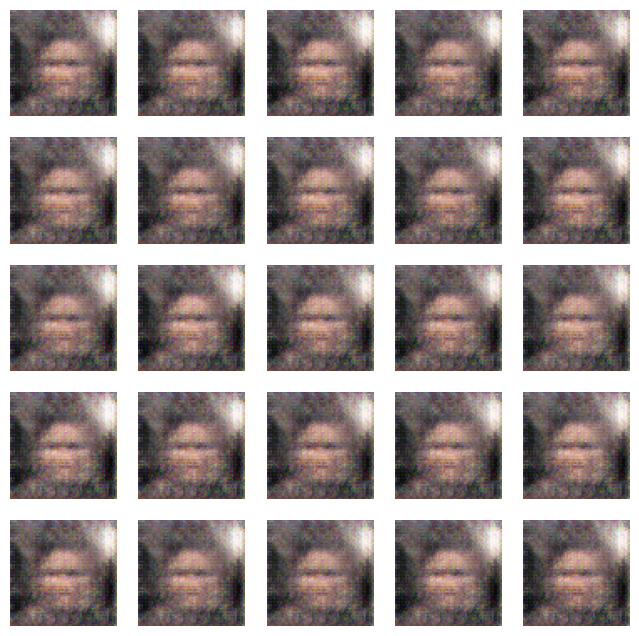

707/707 [==============================] - 68s 74ms/step - d_loss: 1.0863 - g_loss: 1.7058
Epoch 2/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7476 - g_loss: 1.2375

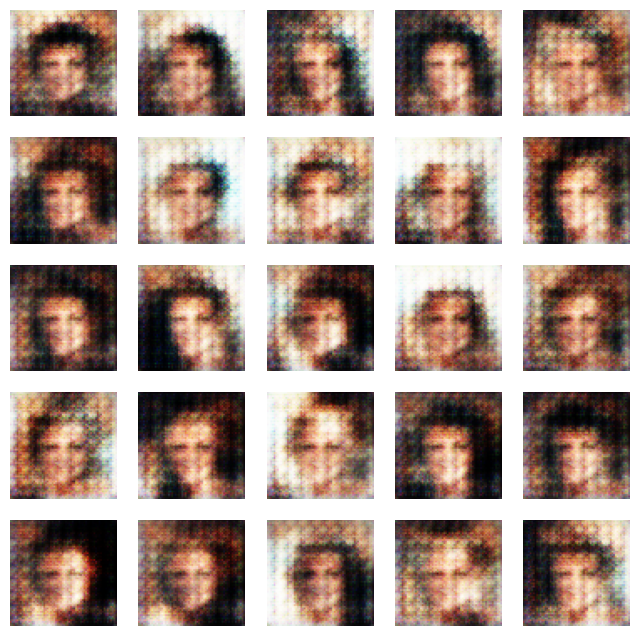

707/707 [==============================] - 52s 74ms/step - d_loss: 0.7476 - g_loss: 1.2367
Epoch 3/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7333 - g_loss: 0.7629

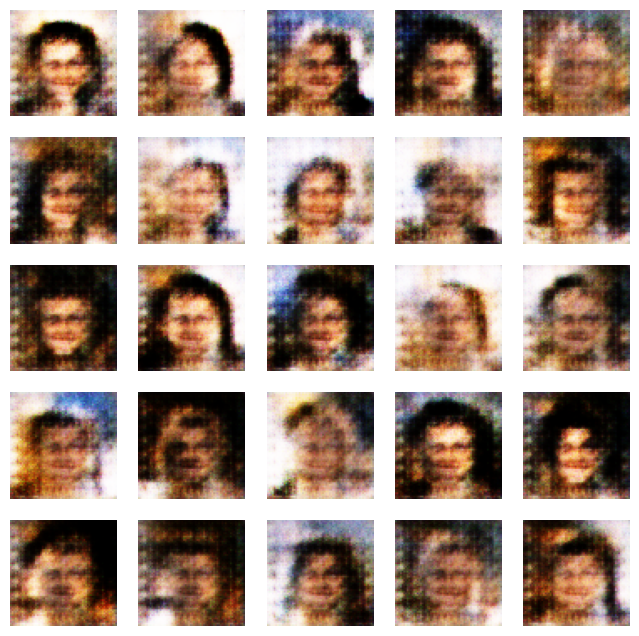

707/707 [==============================] - 54s 77ms/step - d_loss: 0.7334 - g_loss: 0.7629
Epoch 4/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7131 - g_loss: 0.7748

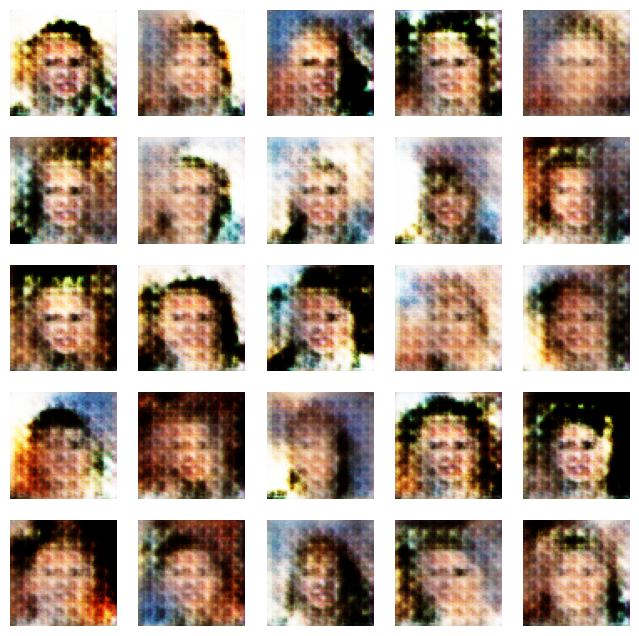

707/707 [==============================] - 56s 79ms/step - d_loss: 0.7130 - g_loss: 0.7746
Epoch 5/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7245 - g_loss: 0.7482

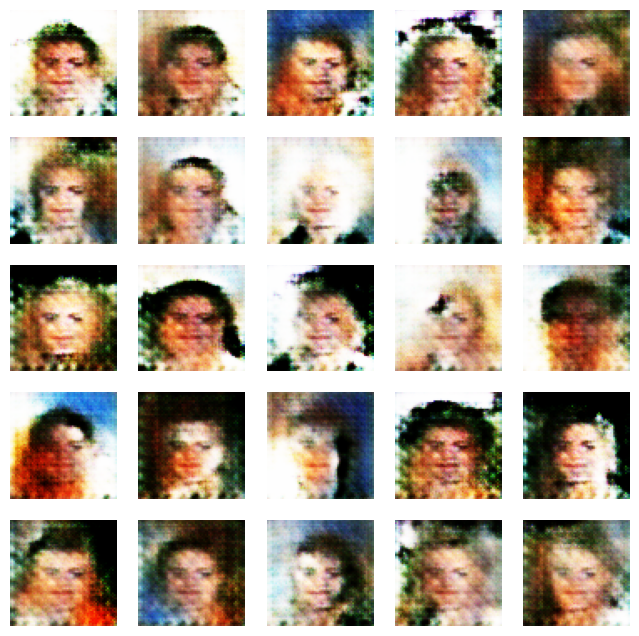

707/707 [==============================] - 55s 78ms/step - d_loss: 0.7245 - g_loss: 0.7485
Epoch 6/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7193 - g_loss: 0.7402

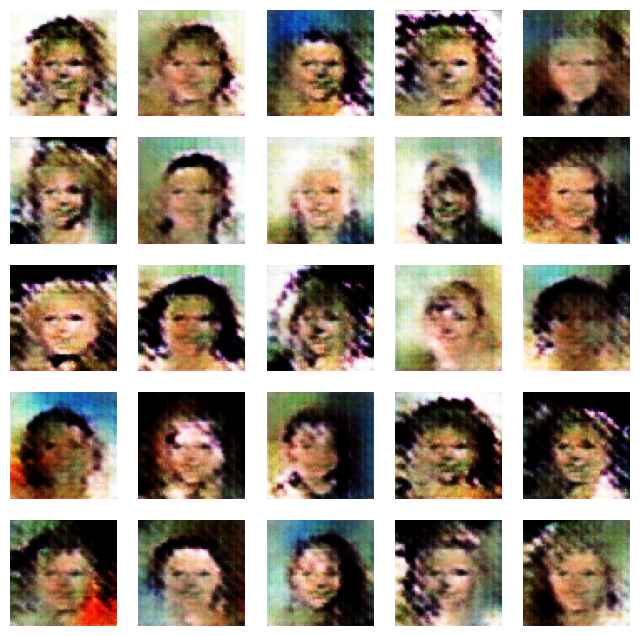

707/707 [==============================] - 57s 81ms/step - d_loss: 0.7194 - g_loss: 0.7402
Epoch 7/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7156 - g_loss: 0.7257

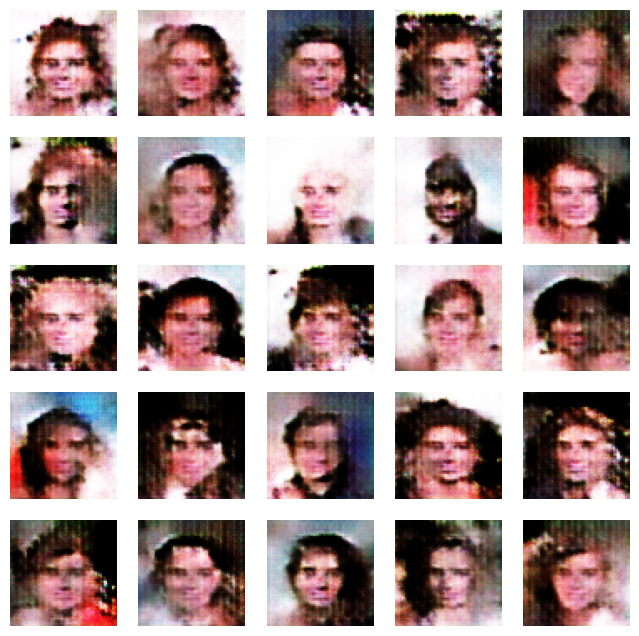

707/707 [==============================] - 57s 81ms/step - d_loss: 0.7156 - g_loss: 0.7259
Epoch 8/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7120 - g_loss: 0.7194

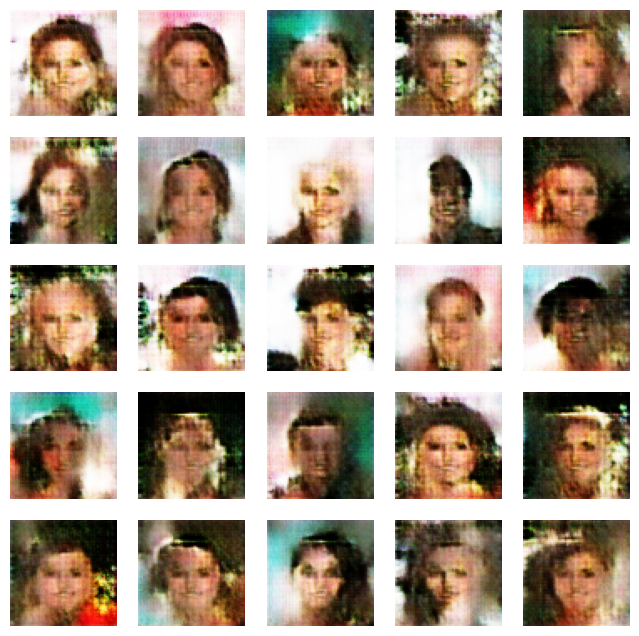

707/707 [==============================] - 58s 82ms/step - d_loss: 0.7121 - g_loss: 0.7195
Epoch 9/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7132 - g_loss: 0.7076

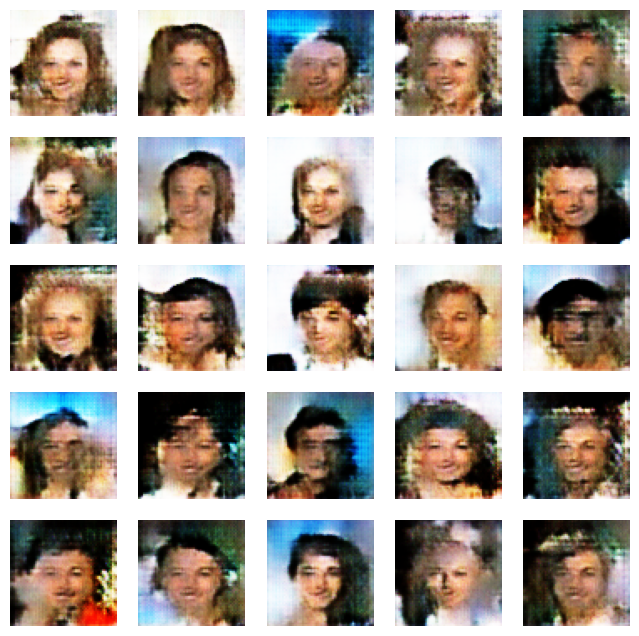

707/707 [==============================] - 57s 81ms/step - d_loss: 0.7132 - g_loss: 0.7078
Epoch 10/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7142 - g_loss: 0.6950

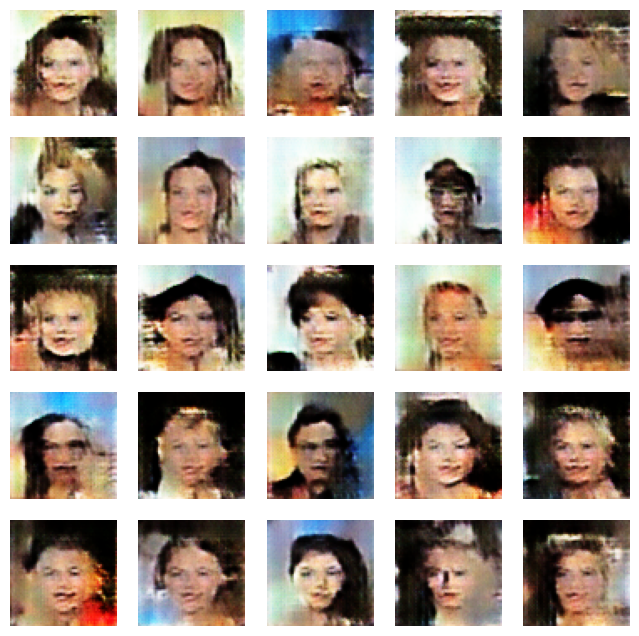

707/707 [==============================] - 56s 79ms/step - d_loss: 0.7142 - g_loss: 0.6950
Epoch 11/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7141 - g_loss: 0.6876

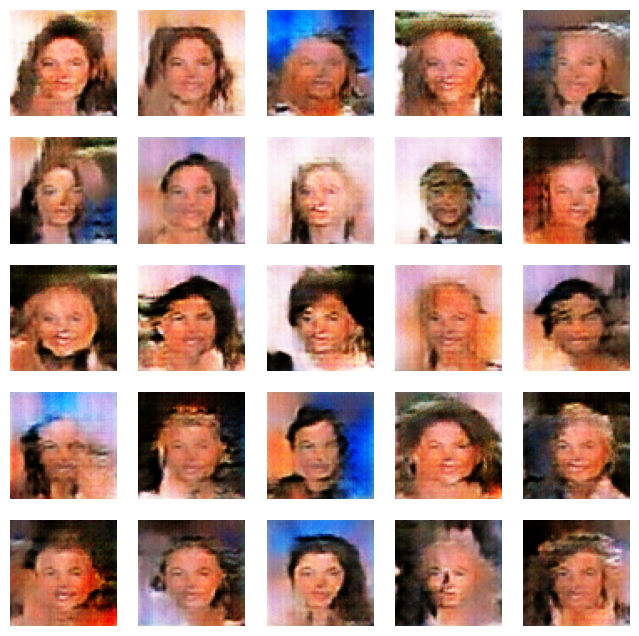

707/707 [==============================] - 56s 80ms/step - d_loss: 0.7141 - g_loss: 0.6876
Epoch 12/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7092 - g_loss: 0.6879

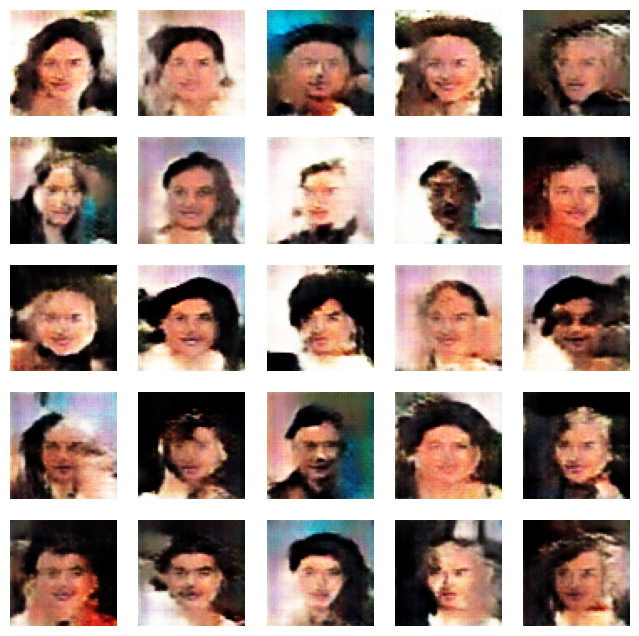

707/707 [==============================] - 55s 78ms/step - d_loss: 0.7092 - g_loss: 0.6880
Epoch 13/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7079 - g_loss: 0.6848

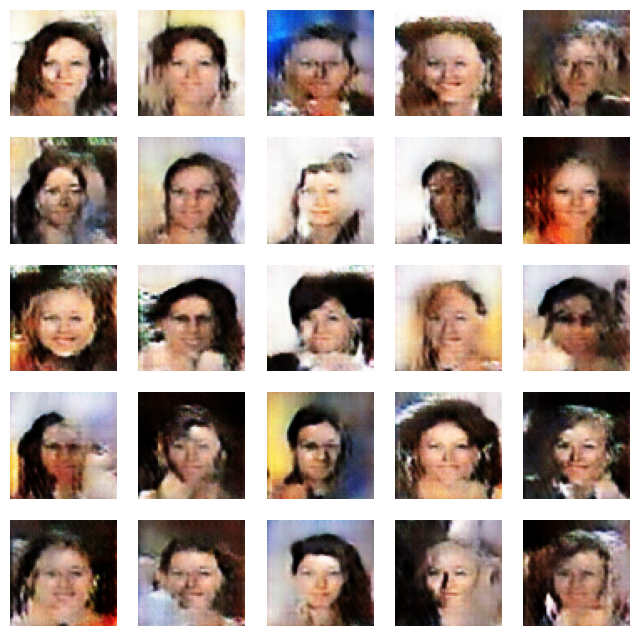

707/707 [==============================] - 56s 79ms/step - d_loss: 0.7080 - g_loss: 0.6850
Epoch 14/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7052 - g_loss: 0.6844

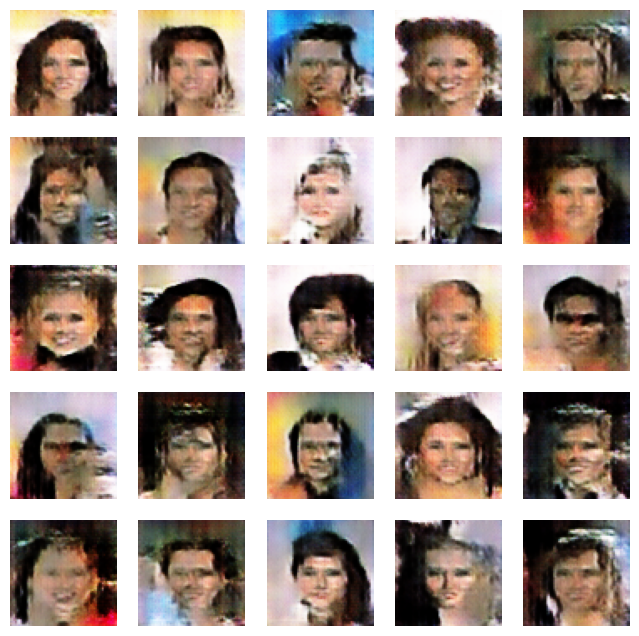

707/707 [==============================] - 55s 78ms/step - d_loss: 0.7052 - g_loss: 0.6844
Epoch 15/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7044 - g_loss: 0.6874

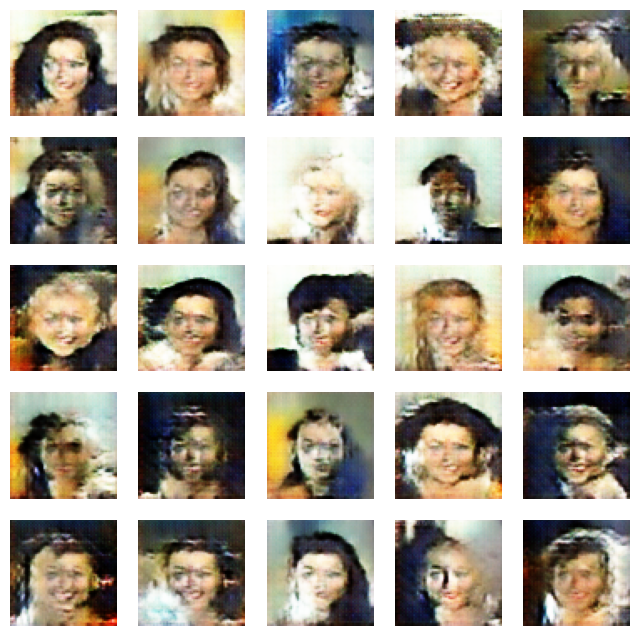

707/707 [==============================] - 56s 79ms/step - d_loss: 0.7045 - g_loss: 0.6874
Epoch 16/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7037 - g_loss: 0.6837

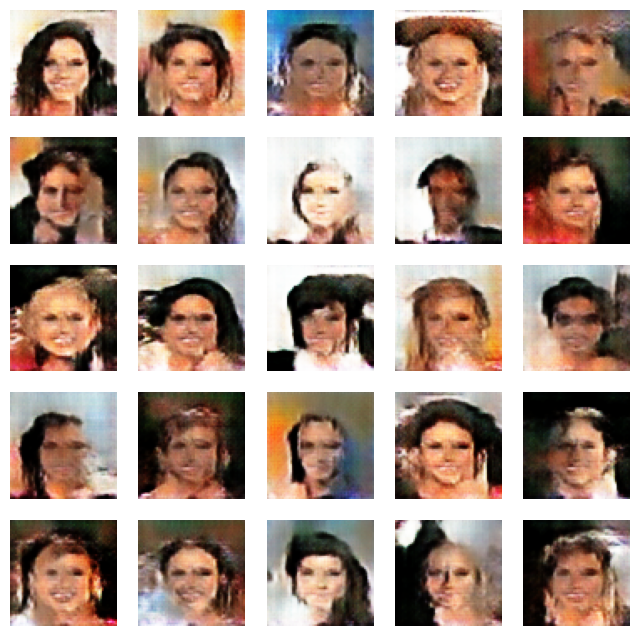

707/707 [==============================] - 56s 79ms/step - d_loss: 0.7037 - g_loss: 0.6837
Epoch 17/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7024 - g_loss: 0.6863

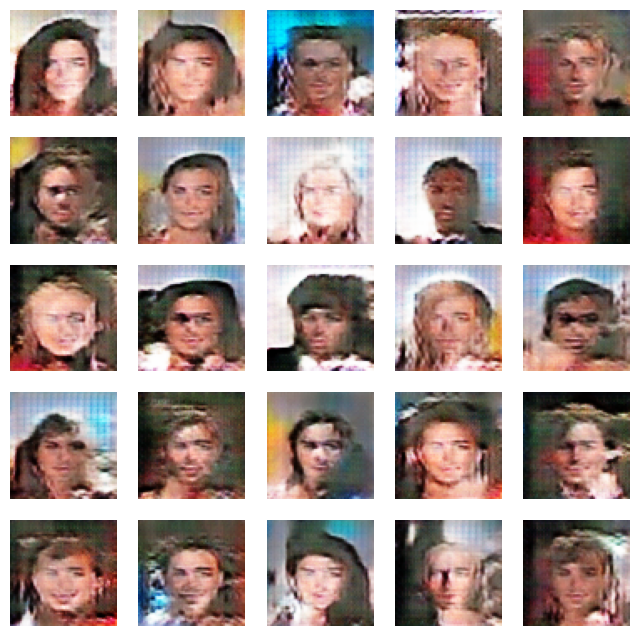

707/707 [==============================] - 56s 80ms/step - d_loss: 0.7024 - g_loss: 0.6864
Epoch 18/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7021 - g_loss: 0.6843

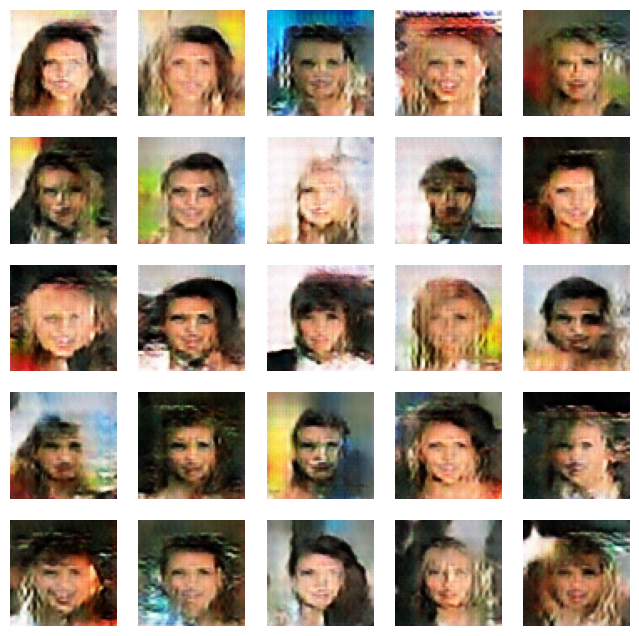

707/707 [==============================] - 57s 80ms/step - d_loss: 0.7021 - g_loss: 0.6844
Epoch 19/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7015 - g_loss: 0.6849

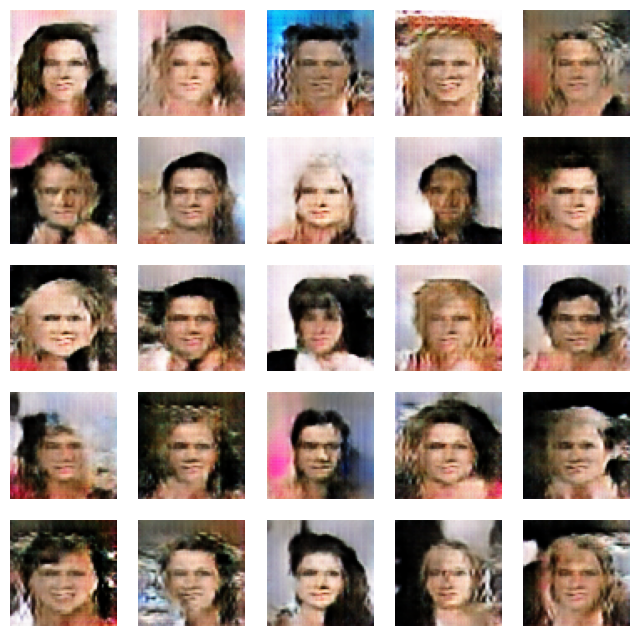

707/707 [==============================] - 56s 79ms/step - d_loss: 0.7015 - g_loss: 0.6849
Epoch 20/50
706/707 [============================>.] - ETA: 0s - d_loss: 0.7001 - g_loss: 0.6849

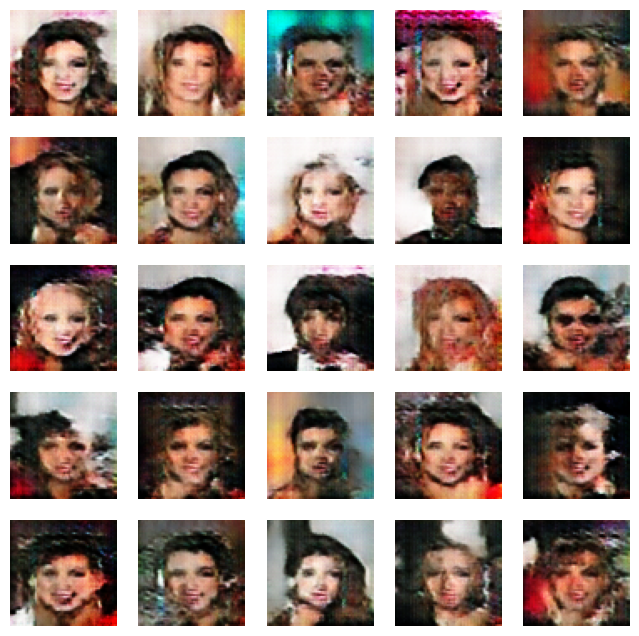

707/707 [==============================] - 55s 78ms/step - d_loss: 0.7001 - g_loss: 0.6849
Epoch 21/50
681/707 [===========================>..] - ETA: 1s - d_loss: 0.7004 - g_loss: 0.6852

In [ ]:
N_EPOCHS = 50
dcgan.fit(train_images, epochs = N_EPOCHS, callbacks = [DCGANMonitor()])

#### Step 8: Generate new images from the trainined model.

In [ ]:
# Create random noise.
noise = tf.random.normal([1, 100])

# Generate image from noise.
g_img = dcgan.generator(noise)
    
# Denormalize the image.
g_img = (g_img * 127.5) + 127.5
g_img.numpy()
img = array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')
plt.savefig('/content/generated/new_image.png')
plt.show()

#### Step 9: Download the Generator Keras model and the generated images.

In [ ]:
!zip -r /content/generated.zip /content/generated
files.download('/content/generated.zip')
files.download('generator.h5')